Preprocessing part of Udemy's machine learning-based 
[Integrating Python, SQL, and Tableau course](https://www.udemy.com/course/python-sql-tableau-integrating-python-sql-and-tableau) which I am currently doing. 

The data is based on anonymous workers' profiles and reasons for absence.

The purpose of this course exercise is to explore whether a person presenting certain characteristics is expected to 
be excessively absent from work or not at some point.

In this notebook I:

1.Loaded a raw dataset

2.Made checkpoint copies to back up data and avoid the re-execution of the entire code.  

3.Converted the "Reason for Absence column" into dummy variables to later be able to explore whether or not a specific known (not 0 = unknown) reason for absence would cause an individual to be excessively absent from work.

4.Grouped the 28 reasons for absence into 4 groups.

5.Converted the "Date" column to the timestamp format in order to extract the day and the month.

6.Extracted the day and the month from the Date column for predciting absenteeism on a specific workday.

7.Saved the preprocessed data for ML purposes.

In [1]:
import pandas as pd

In [7]:
raw_csv_data = pd.read_csv('absenteeism_data.csv')

## Feature Descriptions

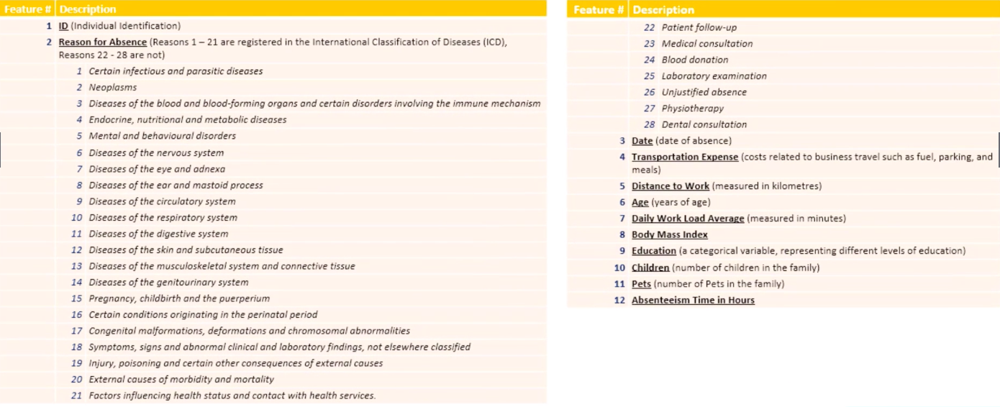

In [8]:
raw_csv_data

,ID,Reason for Absence,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours
0,11,26,07/07/2015,289,36,33,239.554,30,1,2,1,4
1,36,0,14/07/2015,118,13,50,239.554,31,1,1,0,0
2,3,23,15/07/2015,179,51,38,239.554,31,1,0,0,2
3,7,7,16/07/2015,279,5,39,239.554,24,1,2,0,4
4,11,23,23/07/2015,289,36,33,239.554,30,1,2,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...
695,17,10,23/05/2018,179,22,40,237.656,22,2,2,0,8
696,28,6,23/05/2018,225,26,28,237.656,24,1,1,2,3
697,18,10,24/05/2018,330,16,28,237.656,25,2,0,0,8
698,25,23,24/05/2018,235,16,32,237.656,25,3,0,0,2


In [9]:
df = raw_csv_data.copy()

In [10]:
df

,ID,Reason for Absence,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours
0,11,26,07/07/2015,289,36,33,239.554,30,1,2,1,4
1,36,0,14/07/2015,118,13,50,239.554,31,1,1,0,0
2,3,23,15/07/2015,179,51,38,239.554,31,1,0,0,2
3,7,7,16/07/2015,279,5,39,239.554,24,1,2,0,4
4,11,23,23/07/2015,289,36,33,239.554,30,1,2,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...
695,17,10,23/05/2018,179,22,40,237.656,22,2,2,0,8
696,28,6,23/05/2018,225,26,28,237.656,24,1,1,2,3
697,18,10,24/05/2018,330,16,28,237.656,25,2,0,0,8
698,25,23,24/05/2018,235,16,32,237.656,25,3,0,0,2


In [11]:
pd.options.display.max_columns = None

In [12]:
pd.options.display.max_rows = None

In [13]:
display(df)

,ID,Reason for Absence,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours
0,11,26,07/07/2015,289,36,33,239.554,30,1,2,1,4
1,36,0,14/07/2015,118,13,50,239.554,31,1,1,0,0
2,3,23,15/07/2015,179,51,38,239.554,31,1,0,0,2
3,7,7,16/07/2015,279,5,39,239.554,24,1,2,0,4
4,11,23,23/07/2015,289,36,33,239.554,30,1,2,1,2
5,3,23,10/07/2015,179,51,38,239.554,31,1,0,0,2
6,10,22,17/07/2015,361,52,28,239.554,27,1,1,4,8
7,20,23,24/07/2015,260,50,36,239.554,23,1,4,0,4
8,14,19,06/07/2015,155,12,34,239.554,25,1,2,0,40
9,1,22,13/07/2015,235,11,37,239.554,29,3,1,1,8


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 700 entries, 0 to 699
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   ID                         700 non-null    int64  
 1   Reason for Absence         700 non-null    int64  
 2   Date                       700 non-null    object 
 3   Transportation Expense     700 non-null    int64  
 4   Distance to Work           700 non-null    int64  
 5   Age                        700 non-null    int64  
 6   Daily Work Load Average    700 non-null    float64
 7   Body Mass Index            700 non-null    int64  
 8   Education                  700 non-null    int64  
 9   Children                   700 non-null    int64  
 10  Pets                       700 non-null    int64  
 11  Absenteeism Time in Hours  700 non-null    int64  
dtypes: float64(1), int64(10), object(1)
memory usage: 65.8+ KB


In [15]:
df.drop(['ID'], axis = 1)

,Reason for Absence,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours
0,26,07/07/2015,289,36,33,239.554,30,1,2,1,4
1,0,14/07/2015,118,13,50,239.554,31,1,1,0,0
2,23,15/07/2015,179,51,38,239.554,31,1,0,0,2
3,7,16/07/2015,279,5,39,239.554,24,1,2,0,4
4,23,23/07/2015,289,36,33,239.554,30,1,2,1,2
5,23,10/07/2015,179,51,38,239.554,31,1,0,0,2
6,22,17/07/2015,361,52,28,239.554,27,1,1,4,8
7,23,24/07/2015,260,50,36,239.554,23,1,4,0,4
8,19,06/07/2015,155,12,34,239.554,25,1,2,0,40
9,22,13/07/2015,235,11,37,239.554,29,3,1,1,8


In [16]:
df = df.drop(['ID'], axis = 1)

In [17]:
df
df.to_csv('no_id.csv')

In [18]:
raw_csv_data

,ID,Reason for Absence,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours
0,11,26,07/07/2015,289,36,33,239.554,30,1,2,1,4
1,36,0,14/07/2015,118,13,50,239.554,31,1,1,0,0
2,3,23,15/07/2015,179,51,38,239.554,31,1,0,0,2
3,7,7,16/07/2015,279,5,39,239.554,24,1,2,0,4
4,11,23,23/07/2015,289,36,33,239.554,30,1,2,1,2
5,3,23,10/07/2015,179,51,38,239.554,31,1,0,0,2
6,10,22,17/07/2015,361,52,28,239.554,27,1,1,4,8
7,20,23,24/07/2015,260,50,36,239.554,23,1,4,0,4
8,14,19,06/07/2015,155,12,34,239.554,25,1,2,0,40
9,1,22,13/07/2015,235,11,37,239.554,29,3,1,1,8


In [19]:
df['Reason for Absence']

0      26
1       0
2      23
3       7
4      23
5      23
6      22
7      23
8      19
9      22
10      1
11      1
12     11
13     11
14     23
15     14
16     23
17     21
18     11
19     23
20     10
21     11
22     13
23     28
24     18
25     25
26     23
27     28
28     18
29     23
30     18
31     18
32     23
33     18
34     23
35     23
36     24
37     11
38     28
39     23
40     23
41     23
42     23
43     19
44     23
45     23
46     23
47     23
48     22
49     14
50      0
51      0
52     23
53     23
54      0
55      0
56     18
57     23
58      0
59     23
60     23
61     23
62     23
63     23
64      0
65     23
66     23
67     23
68     23
69     23
70     23
71     23
72     23
73     23
74     19
75     14
76     28
77     26
78     23
79     28
80     23
81     23
82     13
83     21
84     23
85     10
86     22
87     14
88     23
89      6
90     23
91     21
92     13
93     28
94     28
95     28
96      7
97     23
98     23
99     19


In [20]:
df['Reason for Absence'].min()

0

In [21]:
df['Reason for Absence'].max()

28

In [22]:
pd.unique(df['Reason for Absence'])

array([26,  0, 23,  7, 22, 19,  1, 11, 14, 21, 10, 13, 28, 18, 25, 24,  6,
       27, 17,  8, 12,  5,  9, 15,  4,  3,  2, 16], dtype=int64)

In [23]:
df['Reason for Absence'].unique()

array([26,  0, 23,  7, 22, 19,  1, 11, 14, 21, 10, 13, 28, 18, 25, 24,  6,
       27, 17,  8, 12,  5,  9, 15,  4,  3,  2, 16], dtype=int64)

In [24]:
len(df['Reason for Absence'].unique())

28

In [25]:
sorted(df['Reason for Absence'].unique())

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28]

In [26]:
import pandas as pd
reason_columns = pd.get_dummies(df['Reason for Absence'])

In [27]:
reason_columns

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,21,22,23,24,25,26,27,28
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [28]:
reason_columns['check'] = reason_columns.sum(axis=1)

In [29]:
reason_columns

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,21,22,23,24,25,26,27,28,check
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1


In [30]:
reason_columns['check'].sum(axis = 0)

700

In [31]:
reason_columns['check'].unique()

array([1], dtype=int64)

In [32]:
reason_columns = reason_columns.drop(['check'], axis = 1)
reason_columns

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,21,22,23,24,25,26,27,28
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [33]:
reason_columns = pd.get_dummies(df['Reason for Absence'], drop_first = True)

In [34]:
reason_columns

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,21,22,23,24,25,26,27,28
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


## Grouping the Reasons for Absence:

In [35]:
df.columns.values

array(['Reason for Absence', 'Date', 'Transportation Expense',
       'Distance to Work', 'Age', 'Daily Work Load Average',
       'Body Mass Index', 'Education', 'Children', 'Pets',
       'Absenteeism Time in Hours'], dtype=object)

In [36]:
reason_columns.columns.values

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 21, 22, 23, 24, 25, 26, 27, 28], dtype=int64)

In [37]:
df = df.drop(['Reason for Absence'], axis = 1)

In [38]:
df

,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours
0,07/07/2015,289,36,33,239.554,30,1,2,1,4
1,14/07/2015,118,13,50,239.554,31,1,1,0,0
2,15/07/2015,179,51,38,239.554,31,1,0,0,2
3,16/07/2015,279,5,39,239.554,24,1,2,0,4
4,23/07/2015,289,36,33,239.554,30,1,2,1,2
5,10/07/2015,179,51,38,239.554,31,1,0,0,2
6,17/07/2015,361,52,28,239.554,27,1,1,4,8
7,24/07/2015,260,50,36,239.554,23,1,4,0,4
8,06/07/2015,155,12,34,239.554,25,1,2,0,40
9,13/07/2015,235,11,37,239.554,29,3,1,1,8


In [39]:
reason_type_1 = reason_columns.loc[:, 1:14].max(axis=1)
reason_type_2 = reason_columns.loc[:, 15:18].max(axis=1)
reason_type_3 = reason_columns.loc[:, 18:21].max(axis=1)
reason_type_4 = reason_columns.loc[:, 22:].max(axis=1)

In [40]:
reason_type_2

0      0
1      0
2      0
3      0
4      0
5      0
6      0
7      0
8      0
9      0
10     0
11     0
12     0
13     0
14     0
15     0
16     0
17     0
18     0
19     0
20     0
21     0
22     0
23     0
24     1
25     0
26     0
27     0
28     1
29     0
30     1
31     1
32     0
33     1
34     0
35     0
36     0
37     0
38     0
39     0
40     0
41     0
42     0
43     0
44     0
45     0
46     0
47     0
48     0
49     0
50     0
51     0
52     0
53     0
54     0
55     0
56     1
57     0
58     0
59     0
60     0
61     0
62     0
63     0
64     0
65     0
66     0
67     0
68     0
69     0
70     0
71     0
72     0
73     0
74     0
75     0
76     0
77     0
78     0
79     0
80     0
81     0
82     0
83     0
84     0
85     0
86     0
87     0
88     0
89     0
90     0
91     0
92     0
93     0
94     0
95     0
96     0
97     0
98     0
99     0
100    0
101    0
102    0
103    0
104    0
105    0
106    0
107    0
108    0
109    0
110    0
1

## Concatenating Column Values

In [41]:
import pandas as pd

In [42]:
df

,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours
0,07/07/2015,289,36,33,239.554,30,1,2,1,4
1,14/07/2015,118,13,50,239.554,31,1,1,0,0
2,15/07/2015,179,51,38,239.554,31,1,0,0,2
3,16/07/2015,279,5,39,239.554,24,1,2,0,4
4,23/07/2015,289,36,33,239.554,30,1,2,1,2
5,10/07/2015,179,51,38,239.554,31,1,0,0,2
6,17/07/2015,361,52,28,239.554,27,1,1,4,8
7,24/07/2015,260,50,36,239.554,23,1,4,0,4
8,06/07/2015,155,12,34,239.554,25,1,2,0,40
9,13/07/2015,235,11,37,239.554,29,3,1,1,8


In [43]:
df = pd.concat([df, reason_type_1, reason_type_2, reason_type_3, reason_type_4], axis = 1)
df

,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours,0,1,2,3
0,07/07/2015,289,36,33,239.554,30,1,2,1,4,0,0,0,1
1,14/07/2015,118,13,50,239.554,31,1,1,0,0,0,0,0,0
2,15/07/2015,179,51,38,239.554,31,1,0,0,2,0,0,0,1
3,16/07/2015,279,5,39,239.554,24,1,2,0,4,1,0,0,0
4,23/07/2015,289,36,33,239.554,30,1,2,1,2,0,0,0,1
5,10/07/2015,179,51,38,239.554,31,1,0,0,2,0,0,0,1
6,17/07/2015,361,52,28,239.554,27,1,1,4,8,0,0,0,1
7,24/07/2015,260,50,36,239.554,23,1,4,0,4,0,0,0,1
8,06/07/2015,155,12,34,239.554,25,1,2,0,40,0,0,1,0
9,13/07/2015,235,11,37,239.554,29,3,1,1,8,0,0,0,1


In [44]:
df.columns.values

array(['Date', 'Transportation Expense', 'Distance to Work', 'Age',
       'Daily Work Load Average', 'Body Mass Index', 'Education',
       'Children', 'Pets', 'Absenteeism Time in Hours', 0, 1, 2, 3],
      dtype=object)

In [45]:
column_names = ['Date', 'Transportation Expense', 'Distance to Work', 'Age',
       'Daily Work Load Average', 'Body Mass Index', 'Education',
       'Children', 'Pets', 'Absenteeism Time in Hours', 'Reason_1', 'Reason_2', 'Reason_3', 'Reason_4']

In [46]:
df.columns = column_names

In [47]:
df.head()

,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours,Reason_1,Reason_2,Reason_3,Reason_4
0,07/07/2015,289,36,33,239.554,30,1,2,1,4,0,0,0,1
1,14/07/2015,118,13,50,239.554,31,1,1,0,0,0,0,0,0
2,15/07/2015,179,51,38,239.554,31,1,0,0,2,0,0,0,1
3,16/07/2015,279,5,39,239.554,24,1,2,0,4,1,0,0,0
4,23/07/2015,289,36,33,239.554,30,1,2,1,2,0,0,0,1


## Reorder Columns

In [48]:
column_names_reordered = ['Reason_1', 'Reason_2', 'Reason_3', 'Reason_4', 
                          'Date', 'Transportation Expense', 'Distance to Work', 'Age',
       'Daily Work Load Average', 'Body Mass Index', 'Education',
       'Children', 'Pets', 'Absenteeism Time in Hours']

In [49]:
df = df[column_names_reordered]

In [50]:
df.head()

,Reason_1,Reason_2,Reason_3,Reason_4,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours
0,0,0,0,1,07/07/2015,289,36,33,239.554,30,1,2,1,4
1,0,0,0,0,14/07/2015,118,13,50,239.554,31,1,1,0,0
2,0,0,0,1,15/07/2015,179,51,38,239.554,31,1,0,0,2
3,1,0,0,0,16/07/2015,279,5,39,239.554,24,1,2,0,4
4,0,0,0,1,23/07/2015,289,36,33,239.554,30,1,2,1,2


## Creating a Checkpoint


In [51]:
df_reason_mod = df.copy()
df_reason_mod

,Reason_1,Reason_2,Reason_3,Reason_4,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours
0,0,0,0,1,07/07/2015,289,36,33,239.554,30,1,2,1,4
1,0,0,0,0,14/07/2015,118,13,50,239.554,31,1,1,0,0
2,0,0,0,1,15/07/2015,179,51,38,239.554,31,1,0,0,2
3,1,0,0,0,16/07/2015,279,5,39,239.554,24,1,2,0,4
4,0,0,0,1,23/07/2015,289,36,33,239.554,30,1,2,1,2
5,0,0,0,1,10/07/2015,179,51,38,239.554,31,1,0,0,2
6,0,0,0,1,17/07/2015,361,52,28,239.554,27,1,1,4,8
7,0,0,0,1,24/07/2015,260,50,36,239.554,23,1,4,0,4
8,0,0,1,0,06/07/2015,155,12,34,239.554,25,1,2,0,40
9,0,0,0,1,13/07/2015,235,11,37,239.554,29,3,1,1,8


## Date

In [52]:
df_reason_mod['Date']

0      07/07/2015
1      14/07/2015
2      15/07/2015
3      16/07/2015
4      23/07/2015
5      10/07/2015
6      17/07/2015
7      24/07/2015
8      06/07/2015
9      13/07/2015
10     20/07/2015
11     14/07/2015
12     15/07/2015
13     15/07/2015
14     15/07/2015
15     17/07/2015
16     17/07/2015
17     27/07/2015
18     30/07/2015
19     05/08/2015
20     12/08/2015
21     03/08/2015
22     10/08/2015
23     14/08/2015
24     17/08/2015
25     24/08/2015
26     04/08/2015
27     12/08/2015
28     19/08/2015
29     28/08/2015
30     17/08/2015
31     27/08/2015
32     27/08/2015
33     17/08/2015
34     17/08/2015
35     17/08/2015
36     04/08/2015
37     20/08/2015
38     21/08/2015
39     28/08/2015
40     01/09/2015
41     07/09/2015
42     01/09/2015
43     08/09/2015
44     09/09/2015
45     13/09/2015
46     14/09/2015
47     24/09/2015
48     04/09/2015
49     14/09/2015
50     21/09/2015
51     28/09/2015
52     08/09/2015
53     15/09/2015
54     22/09/2015
55     29/

In [53]:
type(df_reason_mod['Date'])

pandas.core.series.Series

In [54]:
type(df_reason_mod['Date'][0])

str

In [55]:
df_reason_mod['Date'] = pd.to_datetime(df_reason_mod['Date'], format = '%d/%m/%Y')

In [56]:
df_reason_mod['Date']

0     2015-07-07
1     2015-07-14
2     2015-07-15
3     2015-07-16
4     2015-07-23
5     2015-07-10
6     2015-07-17
7     2015-07-24
8     2015-07-06
9     2015-07-13
10    2015-07-20
11    2015-07-14
12    2015-07-15
13    2015-07-15
14    2015-07-15
15    2015-07-17
16    2015-07-17
17    2015-07-27
18    2015-07-30
19    2015-08-05
20    2015-08-12
21    2015-08-03
22    2015-08-10
23    2015-08-14
24    2015-08-17
25    2015-08-24
26    2015-08-04
27    2015-08-12
28    2015-08-19
29    2015-08-28
30    2015-08-17
31    2015-08-27
32    2015-08-27
33    2015-08-17
34    2015-08-17
35    2015-08-17
36    2015-08-04
37    2015-08-20
38    2015-08-21
39    2015-08-28
40    2015-09-01
41    2015-09-07
42    2015-09-01
43    2015-09-08
44    2015-09-09
45    2015-09-13
46    2015-09-14
47    2015-09-24
48    2015-09-04
49    2015-09-14
50    2015-09-21
51    2015-09-28
52    2015-09-08
53    2015-09-15
54    2015-09-22
55    2015-09-29
56    2015-09-16
57    2015-09-23
58    2015-09-

In [57]:
type(df_reason_mod['Date'])

pandas.core.series.Series

In [58]:
type(df_reason_mod['Date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [59]:
df_reason_mod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 700 entries, 0 to 699
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Reason_1                   700 non-null    uint8         
 1   Reason_2                   700 non-null    uint8         
 2   Reason_3                   700 non-null    uint8         
 3   Reason_4                   700 non-null    uint8         
 4   Date                       700 non-null    datetime64[ns]
 5   Transportation Expense     700 non-null    int64         
 6   Distance to Work           700 non-null    int64         
 7   Age                        700 non-null    int64         
 8   Daily Work Load Average    700 non-null    float64       
 9   Body Mass Index            700 non-null    int64         
 10  Education                  700 non-null    int64         
 11  Children                   700 non-null    int64         
 12  Pets    

## Extracting the Month Value

In [60]:
df_reason_mod['Date'][0]

Timestamp('2015-07-07 00:00:00')

In [61]:
df_reason_mod.to_csv('df_reason_mod.csv')

In [64]:
df = pd.read_csv('df_reason_mod.csv', index_col = 0)

In [65]:
df

,Reason_1,Reason_2,Reason_3,Reason_4,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours
0,0,0,0,1,2015-07-07,289,36,33,239.554,30,1,2,1,4
1,0,0,0,0,2015-07-14,118,13,50,239.554,31,1,1,0,0
2,0,0,0,1,2015-07-15,179,51,38,239.554,31,1,0,0,2
3,1,0,0,0,2015-07-16,279,5,39,239.554,24,1,2,0,4
4,0,0,0,1,2015-07-23,289,36,33,239.554,30,1,2,1,2
5,0,0,0,1,2015-07-10,179,51,38,239.554,31,1,0,0,2
6,0,0,0,1,2015-07-17,361,52,28,239.554,27,1,1,4,8
7,0,0,0,1,2015-07-24,260,50,36,239.554,23,1,4,0,4
8,0,0,1,0,2015-07-06,155,12,34,239.554,25,1,2,0,40
9,0,0,0,1,2015-07-13,235,11,37,239.554,29,3,1,1,8


In [66]:
df_reason_mod['Date'][0].month

7

In [67]:
list_months = []
list_months

[]

In [68]:
df_reason_mod.shape

(700, 14)

In [69]:
for i in range(df_reason_mod.shape[0]):
    list_months.append(df_reason_mod['Date'][i].month)

In [70]:
list_months

[7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 7,
 

In [71]:
len(list_months)

700

In [72]:
df_reason_mod['Month Value'] = list_months

In [73]:
df_reason_mod.head(20)

,Reason_1,Reason_2,Reason_3,Reason_4,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours,Month Value
0,0,0,0,1,2015-07-07,289,36,33,239.554,30,1,2,1,4,7
1,0,0,0,0,2015-07-14,118,13,50,239.554,31,1,1,0,0,7
2,0,0,0,1,2015-07-15,179,51,38,239.554,31,1,0,0,2,7
3,1,0,0,0,2015-07-16,279,5,39,239.554,24,1,2,0,4,7
4,0,0,0,1,2015-07-23,289,36,33,239.554,30,1,2,1,2,7
5,0,0,0,1,2015-07-10,179,51,38,239.554,31,1,0,0,2,7
6,0,0,0,1,2015-07-17,361,52,28,239.554,27,1,1,4,8,7
7,0,0,0,1,2015-07-24,260,50,36,239.554,23,1,4,0,4,7
8,0,0,1,0,2015-07-06,155,12,34,239.554,25,1,2,0,40,7
9,0,0,0,1,2015-07-13,235,11,37,239.554,29,3,1,1,8,7


## Extracting the Day of the Week

In [75]:
df_reason_mod['Date'][699].weekday()

3

In [76]:
df_reason_mod['Date'][699]

Timestamp('2018-05-31 00:00:00')

In [77]:
def date_to_weekday(date_value):
    return date_value.weekday()

In [78]:
df_reason_mod['Day of the Week'] = df_reason_mod['Date'].apply(date_to_weekday)

In [79]:
df_reason_mod.head()

,Reason_1,Reason_2,Reason_3,Reason_4,Date,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours,Month Value,Day of the Week
0,0,0,0,1,2015-07-07,289,36,33,239.554,30,1,2,1,4,7,1
1,0,0,0,0,2015-07-14,118,13,50,239.554,31,1,1,0,0,7,1
2,0,0,0,1,2015-07-15,179,51,38,239.554,31,1,0,0,2,7,2
3,1,0,0,0,2015-07-16,279,5,39,239.554,24,1,2,0,4,7,3
4,0,0,0,1,2015-07-23,289,36,33,239.554,30,1,2,1,2,7,3


In [81]:
df_reason_mod = df_reason_mod.drop(['Date'], axis = 1)

In [82]:
df_reason_mod.columns.values

array(['Reason_1', 'Reason_2', 'Reason_3', 'Reason_4',
       'Transportation Expense', 'Distance to Work', 'Age',
       'Daily Work Load Average', 'Body Mass Index', 'Education',
       'Children', 'Pets', 'Absenteeism Time in Hours', 'Month Value',
       'Day of the Week'], dtype=object)

In [83]:
df_reason_mod_columns_reordered = ['Reason_1', 'Reason_2', 'Reason_3', 'Reason_4', 'Month Value',
       'Day of the Week',
       'Transportation Expense', 'Distance to Work', 'Age',
       'Daily Work Load Average', 'Body Mass Index', 'Education',
       'Children', 'Pets', 'Absenteeism Time in Hours']

In [85]:
df_reason_mod = df_reason_mod[df_reason_mod_columns_reordered]

In [86]:
df_reason_mod

,Reason_1,Reason_2,Reason_3,Reason_4,Month Value,Day of the Week,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours
0,0,0,0,1,7,1,289,36,33,239.554,30,1,2,1,4
1,0,0,0,0,7,1,118,13,50,239.554,31,1,1,0,0
2,0,0,0,1,7,2,179,51,38,239.554,31,1,0,0,2
3,1,0,0,0,7,3,279,5,39,239.554,24,1,2,0,4
4,0,0,0,1,7,3,289,36,33,239.554,30,1,2,1,2
5,0,0,0,1,7,4,179,51,38,239.554,31,1,0,0,2
6,0,0,0,1,7,4,361,52,28,239.554,27,1,1,4,8
7,0,0,0,1,7,4,260,50,36,239.554,23,1,4,0,4
8,0,0,1,0,7,0,155,12,34,239.554,25,1,2,0,40
9,0,0,0,1,7,0,235,11,37,239.554,29,3,1,1,8


In [87]:
df_reason_date_mod = df_reason_mod.copy()

In [88]:
df_reason_date_mod.to_csv('df_reason_date_mod.csv')

In [3]:
import pandas as pd
df_reason_date_mod = pd.read_csv('df_reason_date_mod.csv', index_col = 0)

In [4]:
df_reason_date_mod.head()

,Reason_1,Reason_2,Reason_3,Reason_4,Month Value,Day of the Week,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours
0,0,0,0,1,7,1,289,36,33,239.554,30,1,2,1,4
1,0,0,0,0,7,1,118,13,50,239.554,31,1,1,0,0
2,0,0,0,1,7,2,179,51,38,239.554,31,1,0,0,2
3,1,0,0,0,7,3,279,5,39,239.554,24,1,2,0,4
4,0,0,0,1,7,3,289,36,33,239.554,30,1,2,1,2


In [5]:
df_reason_date_mod['Education'].unique()

array([1, 3, 2, 4], dtype=int64)

In [6]:
df_reason_date_mod['Education'].value_counts()

1    583
3     73
2     40
4      4
Name: Education, dtype: int64

In [7]:
df_reason_date_mod['Education'] = df_reason_date_mod['Education'].map({1:0, 2:1, 3:1, 4:1})

In [8]:
df_reason_date_mod['Education'].unique()

array([0, 1], dtype=int64)

In [9]:
df_reason_date_mod['Education'].value_counts()

0    583
1    117
Name: Education, dtype: int64

## Final Checkpoint

In [10]:
df_preprocessed = df_reason_date_mod.copy()

In [12]:
df_preprocessed.head(10)

,Reason_1,Reason_2,Reason_3,Reason_4,Month Value,Day of the Week,Transportation Expense,Distance to Work,Age,Daily Work Load Average,Body Mass Index,Education,Children,Pets,Absenteeism Time in Hours
0,0,0,0,1,7,1,289,36,33,239.554,30,0,2,1,4
1,0,0,0,0,7,1,118,13,50,239.554,31,0,1,0,0
2,0,0,0,1,7,2,179,51,38,239.554,31,0,0,0,2
3,1,0,0,0,7,3,279,5,39,239.554,24,0,2,0,4
4,0,0,0,1,7,3,289,36,33,239.554,30,0,2,1,2
5,0,0,0,1,7,4,179,51,38,239.554,31,0,0,0,2
6,0,0,0,1,7,4,361,52,28,239.554,27,0,1,4,8
7,0,0,0,1,7,4,260,50,36,239.554,23,0,4,0,4
8,0,0,1,0,7,0,155,12,34,239.554,25,0,2,0,40
9,0,0,0,1,7,0,235,11,37,239.554,29,1,1,1,8


In [13]:
df_preprocessed.to_csv('Absenteeism_preprocessed.csv', index=False)